# Check Signal-to-Noise Ratio
(Gloria's work)

In [1]:
%load_ext autoreload
%autoreload 2
import waffles
import numpy as np
import json
import shutil 
from tqdm import tqdm

from waffles.input_output.hdf5_structured import load_structured_waveformset
from waffles.data_classes.Waveform import Waveform
from waffles.data_classes.WaveformSet import WaveformSet
from waffles.data_classes.BasicWfAna import BasicWfAna
from waffles.data_classes.IPDict import IPDict
from waffles.data_classes.UniqueChannel import UniqueChannel
from waffles.data_classes.ChannelWsGrid import ChannelWsGrid
from waffles.utils.baseline.baseline import SBaseline
from waffles.np02_utils.AutoMap import generate_ChannelMap, dict_uniqch_to_module, dict_module_to_uniqch
from waffles.np02_utils.PlotUtils import np02_gen_grids, plot_grid, plot_detectors, genhist, fithist, runBasicWfAnaNP02


In [2]:
run=37075
#run = 38648
#run = 38584
#run = 38928
nwaveforms = 80000
dettype = "membrane"
# dettype = "cathode"
hostname = 'np04-srv-004'

## Only change if necessary
output_dir = f"/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning/"
ch = {}
save_single_file = False
max_files  = 4
det = "VD_Cathode_PDS" if dettype == "cathode" else "VD_Membrane_PDS"
endpoint = 106 if dettype == "cathode" else 107
trigger = "self_trigger"

# Way to low... keep scrollng
dletter = dettype.upper()[0] # C or M...
group1 = [ f"{dletter}{detnum}({chnum})" for detnum in range(1, 3) for chnum in range(1,3) ]
group2 = [ f"{dletter}{detnum}({chnum})" for detnum in range(3, 5) for chnum in range(1,3) ]
group3 = [ f"{dletter}{detnum}({chnum})" for detnum in range(5, 7) for chnum in range(1,3) ]
group4 = [ f"{dletter}{detnum}({chnum})" for detnum in range(7, 9) for chnum in range(1,3) ]

In [3]:
wafflespath = waffles.__path__[0]
wafflespath = wafflespath.replace("src/waffles", "scripts")
configfile = shutil.copy(f"{wafflespath}/config.json", f"{wafflespath}/snrcheck_config.json")
with open(configfile, "r") as f:
    configdata = json.load(f)

configdata['runs'] = [run]
configdata['output_dir'] = output_dir
configdata['save_single_file'] = save_single_file
configdata['det'] = det
configdata['trigger'] = trigger
configdata['ch'] = ch
configdata['max_files'] = max_files

with open(configfile, "w") as f:
    json.dump(configdata, f, indent=4)
    print(f"Config file saved to {configfile}")

from pathlib import Path
plotntco = Path(output_dir) / f"plots/run{run:06d}_{dettype}/nTCO.html"
plottco = Path(output_dir) / f"plots/run{run:06d}_{dettype}/TCO.html"

doplot = "true"
# comment in case you want to force plotting
if plotntco.exists() and plottco.exists():
    print(f"Plots already exist:\n{plotntco}\n{plottco}")
    doplot = "false"

Config file saved to /afs/cern.ch/work/l/liacob/waffles/scripts/snrcheck_config.json


In [4]:
'''
%%bash -s "$wafflespath" "$run" "$configfile" "$doplot" "$hostname" "$trigger"

wafflespath=$1
run=$2
configjson=$3
doplot=$4
hostname=$5
trigger=$6

user=$( whoami )
script08="${wafflespath}/08_np02vd_run_downloader_processor.py"
configfile="${wafflespath}/${configjson}"
if [ "${trigger}" != "self_trigger" ]; then
    echo "Please, run the following command in a terminal... IO not supported in notebook"
    echo "python ${script08} --runs ${run} --user ${user} --config-template ${configjson} --kerberos --hostname ${hostname} --headless"
    exit 0
fi

if [ -f ${script08} ]; then
    if [ "$doplot" == "true" ]; then
        echo "Running script with plotting enabled"
        python ${script08} --runs $run --user $user --config-template $configjson --kerberos --hostname ${hostname} --headless 
    else
        echo "Running script without plotting"
        python ${script08} --runs $run --user $user --config-template $configjson --kerberos --hostname ${hostname} 
    fi
else
    echo "Script not found: ${script08}"
fi
'''

'\n%%bash -s "$wafflespath" "$run" "$configfile" "$doplot" "$hostname" "$trigger"\n\nwafflespath=$1\nrun=$2\nconfigjson=$3\ndoplot=$4\nhostname=$5\ntrigger=$6\n\nuser=$( whoami )\nscript08="${wafflespath}/08_np02vd_run_downloader_processor.py"\nconfigfile="${wafflespath}/${configjson}"\nif [ "${trigger}" != "self_trigger" ]; then\n    echo "Please, run the following command in a terminal... IO not supported in notebook"\n    echo "python ${script08} --runs ${run} --user ${user} --config-template ${configjson} --kerberos --hostname ${hostname} --headless"\n    exit 0\nfi\n\nif [ -f ${script08} ]; then\n    if [ "$doplot" == "true" ]; then\n        echo "Running script with plotting enabled"\n        python ${script08} --runs $run --user $user --config-template $configjson --kerberos --hostname ${hostname} --headless \n    else\n        echo "Running script without plotting"\n        python ${script08} --runs $run --user $user --config-template $configjson --kerberos --hostname ${hostnam

In [5]:
from glob import glob
def open_processed(run, dettype, output_dir, nwaveforms=None, mergefiles = False):
    """
    Open the processed waveform set for a given run and detector type.
    """
    try: 
        wfset = load_structured_waveformset(f"{output_dir}/processed/run{run:0d}_{dettype}/processed_merged_run{run:06d}_structured_{dettype}.hdf5", max_waveforms=nwaveforms)
    except:
        files = glob(f"{output_dir}/processed/run{run:06d}_{dettype}/processed_*_run{run:06d}_*_{dettype}.hdf5")
        print("List of files found:")
        print(files)
        if not mergefiles or len(files)==1:
            files = files[0]
            wfset = load_structured_waveformset(files, max_waveforms=nwaveforms)
        else: # NOT TESTED!
            wfset = load_structured_waveformset(files[0], max_waveforms=nwaveforms)
            for f in files[1:]:
                tmpwf = load_structured_waveformset(f, max_waveforms=nwaveforms)
                wfset.merge(tmpwf)
    return wfset

In [6]:
wfset_full = open_processed(run, dettype, output_dir, nwaveforms=nwaveforms)
wfset_full

List of files found:
['/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning//processed/run037075_membrane/processed_np02vd_raw_run037075_0000_df-s04-d0_dw_0_20250707T152147.hdf5.copied_structured_membrane.hdf5']
📤 load_structured_waveformset returning type: <class 'waffles.data_classes.WaveformSet.WaveformSet'> with 80000 waveforms


WaveformSet with 80000 waveforms runs: {37075}, points_per_wf: 1024, available_channels: {37075: {107: {0, 37, 7, 40, 41, 10, 42, 43, 44, 45, 46, 47, 17, 20, 27, 30}}}, record_numbers per run: run 37075: 172 records

In [7]:
from collections import Counter
timestamps = sorted([ wf.timestamp for wf in wfset_full.waveforms ])
c = Counter(timestamps)
print(f"Total number of timestamps: {len(c)}")
matchtimestamps = [ k for k in c if c[k] >= 15]
print(f"Remaining timestamps: {len(matchtimestamps)}")

Total number of timestamps: 5083
Remaining timestamps: 4964


In [8]:
def get_external(waveform: Waveform, validtimes = []) -> bool:
    if np.any((waveform.adcs[0:500] > 16000) | (waveform.adcs[0:500] < 100) ):
        return False
    # if waveform.timestamp in validtimes:
    #     return True
    return True

matchingtimes = []
print(wfset_full)
wfset_full = WaveformSet.from_filtered_WaveformSet(wfset_full, get_external, matchtimestamps, show_progress=True)
print(wfset_full)

WaveformSet with 80000 waveforms runs: {37075}, points_per_wf: 1024, available_channels: {37075: {107: {0, 37, 7, 40, 41, 10, 42, 43, 44, 45, 46, 47, 17, 20, 27, 30}}}, record_numbers per run: run 37075: 172 records



100%|█████████████████████████████████████████████████████████████████████████████████████| 80000/80000 [00:00<00:00, 122239.84it/s]


WaveformSet with 69407 waveforms runs: {37075}, points_per_wf: 1024, available_channels: {37075: {107: {0, 37, 7, 40, 10, 42, 44, 45, 46, 47, 17, 20, 27, 30}}}, record_numbers per run: run 37075: 172 records



In [9]:
histargs = dict(    
    # doprocess = False,
    dofit = False,
    variable = 'integral',
    show_progress = True,
    configyaml="ch_trim_parameters.yaml",
    normalize_hist=True,
)

# histargs['variable'] = 'amplitude'; histargs['bins'] = np.linspace(0,150,150);
# histargs['variable'] = 'baseline'; histargs['bins'] = np.linspace(0,16000,500)
detector=group1
plot_detectors(wfset_full, detector, plot_function=fithist, html=None, wf_func=histargs)
detector=group2
plot_detectors(wfset_full, detector, plot_function=fithist, html=None, wf_func=histargs)
detector=group3
plot_detectors(wfset_full, detector, plot_function=fithist, html=None, wf_func=histargs)
detector=group4
plot_detectors(wfset_full, detector, plot_function=fithist, html=None, wf_func=histargs)

Processing waveform set with BasicWfAna


100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:12<00:00, 393.02it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4972/4972 [00:01<00:00, 4171.16it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:01<00:00, 3397.24it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4976/4976 [00:01<00:00, 4211.97it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4959/4959 [00:01<00:00, 4334.17it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4923/4923 [00:01<00:00, 3293.17it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4943/4943 [00:01<00:00, 4167.99it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4957/4957 [00:01<00:00, 4161.76it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4898/4898 [00:01<00:00, 4122.15it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4931/4931 [00:01<00:00, 4306.60it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4988/4988 [00:01<00:00, 4182.69it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4989/4989 [00:01<00:00, 4089.23it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4933/4933 [00:01<00:00, 4140.20it/s]


Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4938/4938 [00:01<00:00, 4300.71it/s]


In [10]:
def remove_bad_baseline(waveform:Waveform) -> bool:
    # comment the two lines below to not remove any waveform
    if 'std' in waveform.analyses and waveform.analyses["std"].result['amplitude'] is np.nan:
        return False
    return True
    
wfset = WaveformSet.from_filtered_WaveformSet(wfset_full, remove_bad_baseline)


print(f"After removing: {len(wfset.waveforms)} waveforms")
wfch_full = ChannelWsGrid.clusterize_waveform_set(wfset_full)
wfch = ChannelWsGrid.clusterize_waveform_set(wfset)
print("By channel..")
for ep, v in wfch.items():
    print("Endpoint:", ep)
    for ch, wfs in v.items():
        print(f"Ch: {ch}, {len(wfs.waveforms)}, total: {len(wfch_full[ep][ch].waveforms)}")

After removing: 49045 waveforms
By channel..
Endpoint: 107
Ch: 7, 4434, total: 4943
Ch: 10, 4420, total: 4938
Ch: 17, 4404, total: 4933
Ch: 20, 4092, total: 4931
Ch: 27, 3902, total: 4898
Ch: 30, 4615, total: 4989
Ch: 37, 4250, total: 4988
Ch: 44, 3266, total: 4923
Ch: 46, 4028, total: 4959
Ch: 47, 3438, total: 5000
Ch: 0, 4542, total: 4957
Ch: 42, 1666, total: 4976
Ch: 45, 1143, total: 4972
Ch: 40, 845, total: 5000


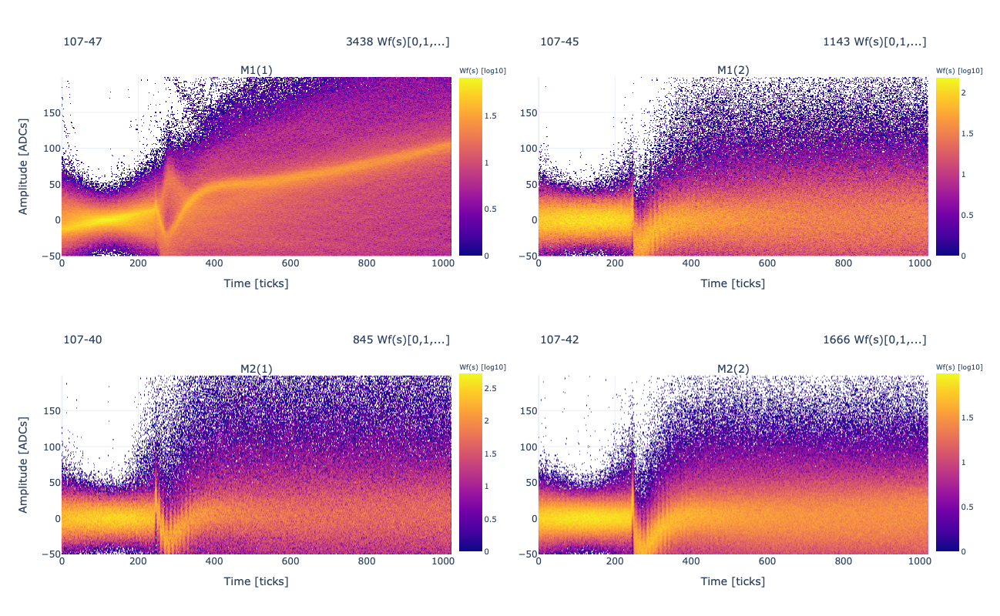

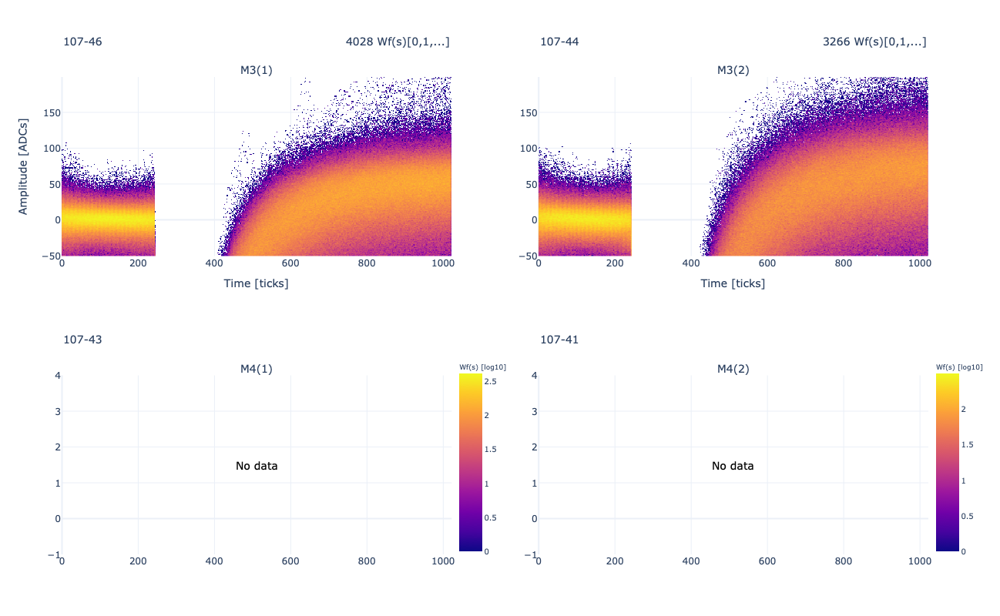

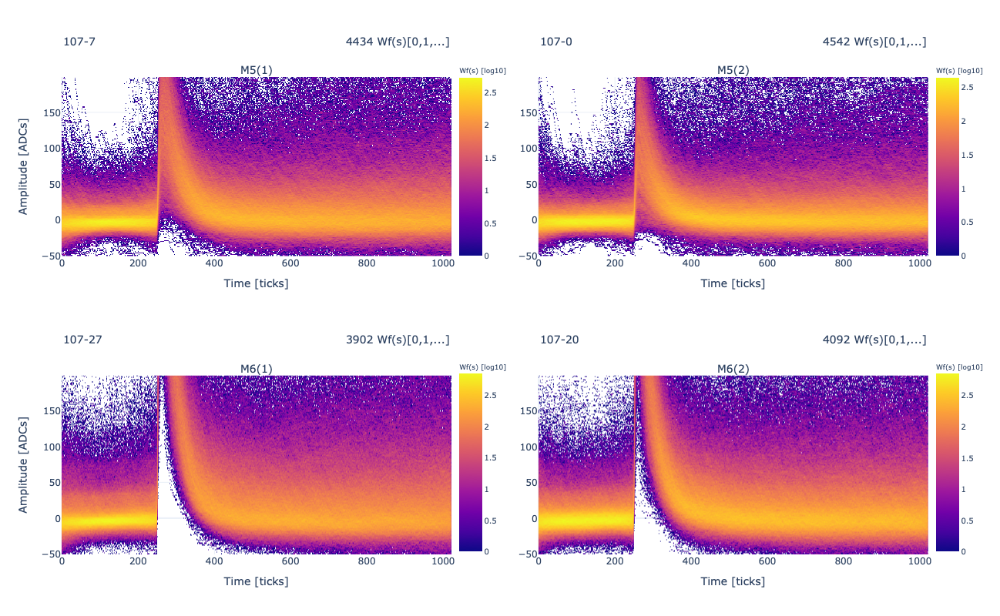

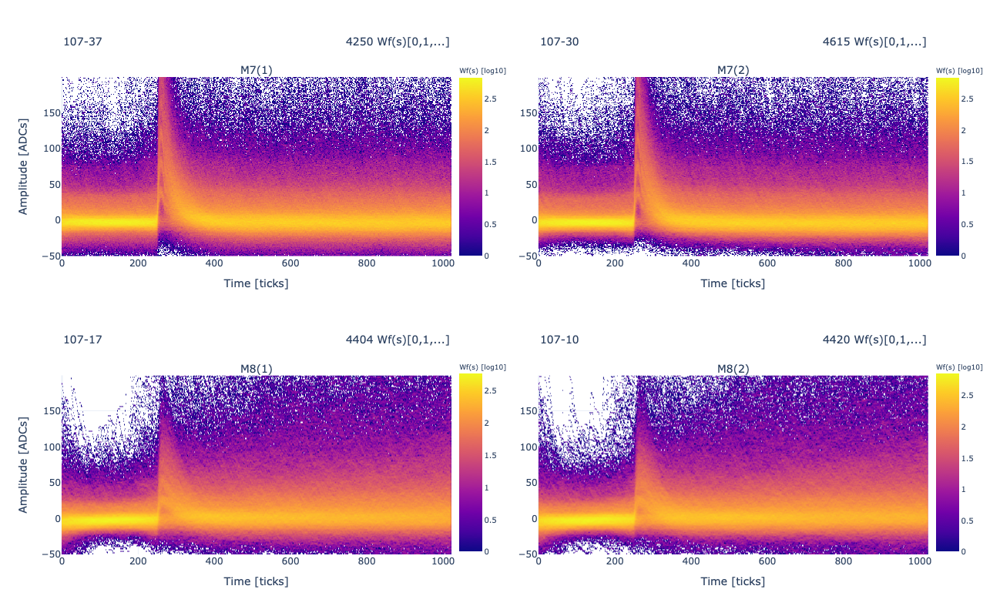

In [18]:
argsheat = dict(
    mode="heatmap",
    analysis_label="std",
    adc_range_above_baseline=200,
    adc_range_below_baseline=-50,
    adc_bins=200,
    #adc_bins=125,
    #adc_bins=10,
    time_bins=wfset.points_per_wf//2,
    filtering=4,
    share_y_scale=False,
    share_x_scale=True,
    wfs_per_axes=5000,
    zlog=True
)

chtrigger='total'

detector=group1
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wfset, detector, html=None, showplots=True, **argsheat)

detector=group2
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wfset, detector, html=None, showplots=True, **argsheat)

detector=group3
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wfset, detector, html=None, showplots=True, **argsheat)

detector=group4
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wfset, detector, html=html, showplots=True, **argsheat)

In [12]:
import matplotlib.pyplot as plt
wftest = ChannelWsGrid.clusterize_waveform_set(wfset)


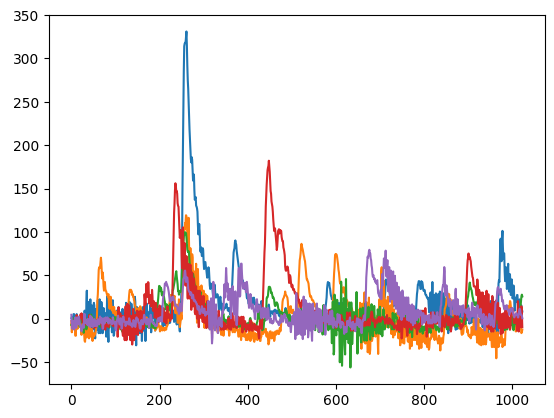

In [13]:
for it in range(5):
    wf = wftest[107][30].waveforms[it]
    # wf = wfset.waveforms[it]
    plt.plot(wf.adcs - wf.analyses['std'].result['baseline'])

In [15]:
detectors=["M7(1)", "M7(2)", "M8(1)", "M8(2)"]
#detectors=["C6(1)", "C6(2)"]

run=37075
#run = 38577
#run=38648
def get_channels(waveform:Waveform, detectors:list) -> bool:
    if dict_uniqch_to_module[str(UniqueChannel(waveform.endpoint, waveform.channel))] in detectors:
        return True
    return False

if nwaveforms is not None:
    wfset_tmp = open_processed(run, dettype, output_dir, nwaveforms=None)
else:
    wfset_tmp = wfset
wfset_fit = WaveformSet.from_filtered_WaveformSet(wfset_tmp, get_channels, detectors=detectors)

List of files found:
['/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning//processed/run037075_membrane/processed_np02vd_raw_run037075_0000_df-s04-d0_dw_0_20250707T152147.hdf5.copied_structured_membrane.hdf5']
📤 load_structured_waveformset returning type: <class 'waffles.data_classes.WaveformSet.WaveformSet'> with 552053 waveforms


Run, Module, snr, gain, baseline std dev, 1pe std dev, integral_mean_in_pe
Processing waveform set with BasicWfAna


100%|███████████████████████████████████████████████████████████████████████████████████████| 34509/34509 [00:08<00:00, 4289.01it/s]


37075, 0.82, 319.48, 388.64, 639.36, 98.14
Processing waveform set with BasicWfAna


100%|███████████████████████████████████████████████████████████████████████████████████████| 34509/34509 [00:08<00:00, 4228.49it/s]


37075, 27.16, 9256.68, 340.88, 418.91, 3.20
Processing waveform set with BasicWfAna


100%|███████████████████████████████████████████████████████████████████████████████████████| 34509/34509 [00:07<00:00, 4326.89it/s]


37075, 36.41, 10481.75, 287.88, 558.34, 1.09
Processing waveform set with BasicWfAna


100%|███████████████████████████████████████████████████████████████████████████████████████| 34507/34507 [00:08<00:00, 4311.35it/s]


37075, 25.41, 9569.14, 376.66, 669.27, 1.03


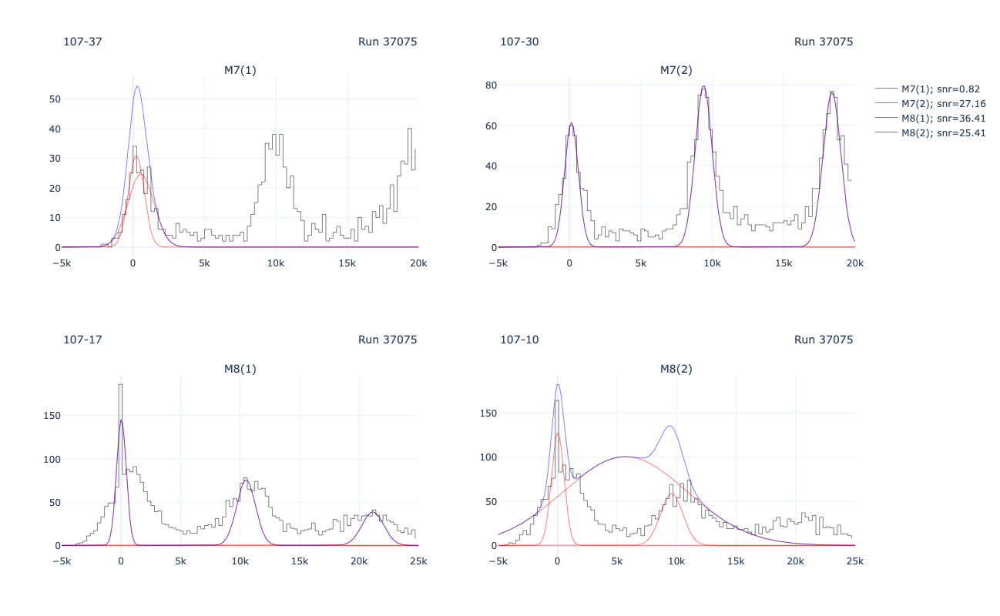

By channel..
Endpoint: 107
Ch: 10, 3977, total: 34507
Ch: 17, 4239, total: 34509
Ch: 30, 4765, total: 34509
Ch: 37, 2648, total: 34509


In [16]:
detectors_x = [ d.replace("(","_").replace(")","") for d in detectors]
html = Path(f"./snr_plots/run{run:06d}_{dettype}_{'_'.join(detectors_x)}.html")
html.parent.mkdir(parents=True, exist_ok=True)
html

fithistargs = dict(
    # doprocess=False, 
    show_progress=True
)

setupargs=dict(
# default 1000x800
    width=1000,
    height=800
)
print("Run, Module, snr, gain, baseline std dev, 1pe std dev, integral_mean_in_pe")
plot_detectors(wfset_fit, detectors, plot_function=fithist, html=html, showplots=True, wf_func=fithistargs, **setupargs)

wfch_fit = ChannelWsGrid.clusterize_waveform_set(wfset_fit)
print("By channel..")
for ep, v in wfch_fit.items():
    print("Endpoint:", ep)
    for ch, wfs in v.items():
        ngoodwaves = [ 1 if wfs.analyses['std'].result['integral'] is not np.nan else 0 for wfs in wfs.waveforms ]
        print(f"Ch: {ch}, {np.sum(ngoodwaves)}, total: {len(wfch_fit[ep][ch].waveforms)}")